In [ ]:
pip install mtcnn

In [ ]:
from google.colab.patches import cv2_imshow

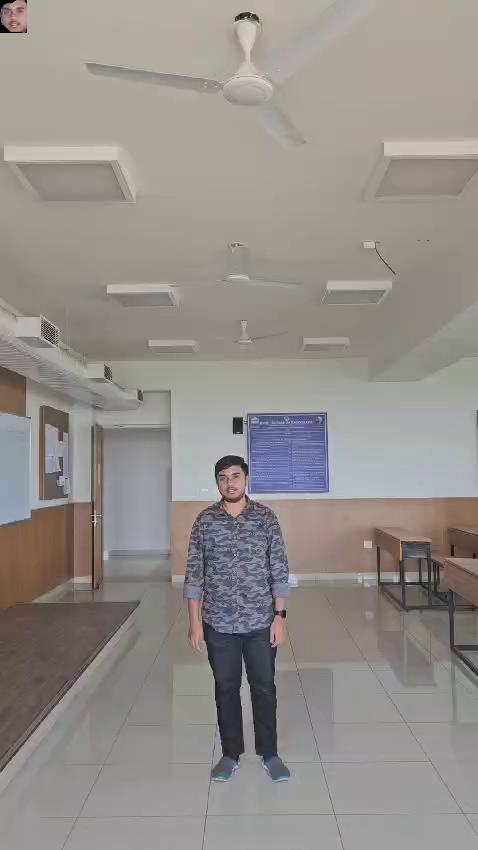

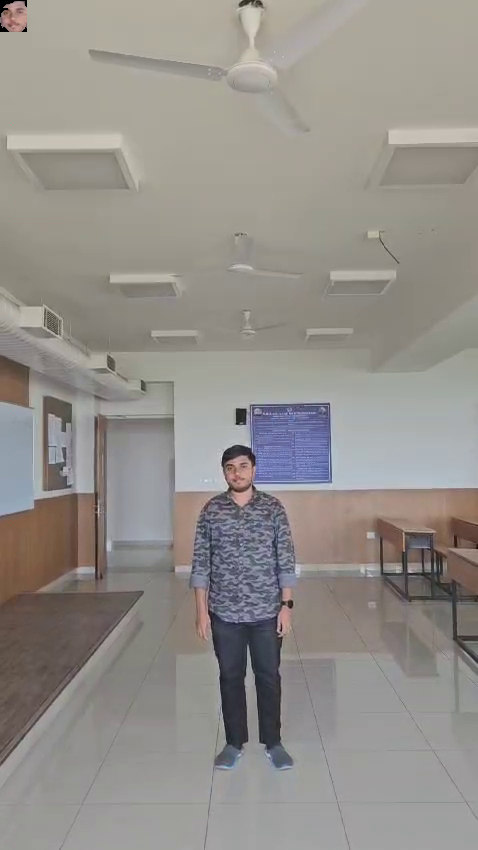

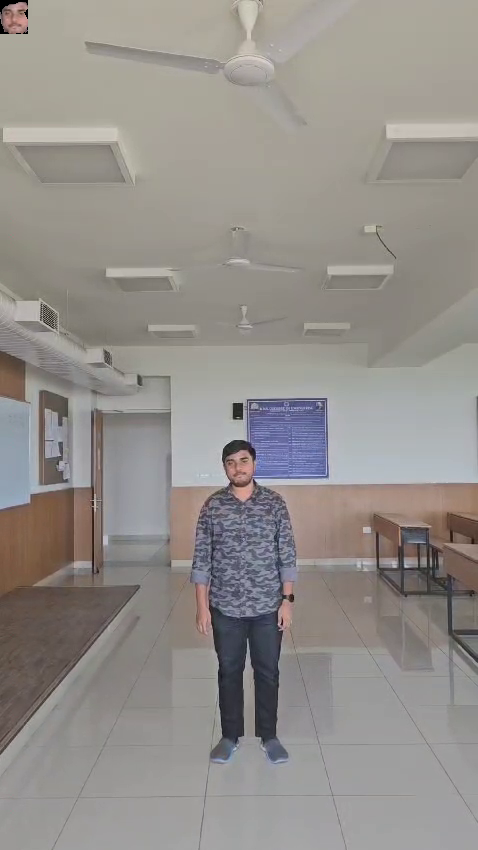

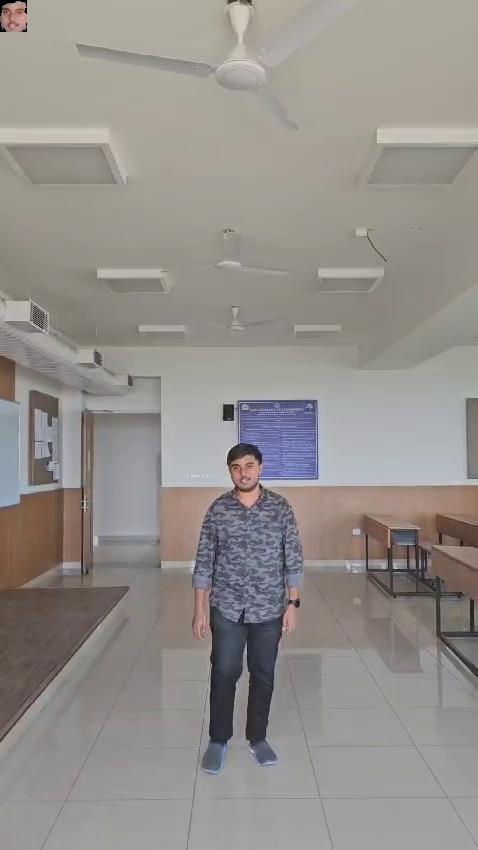

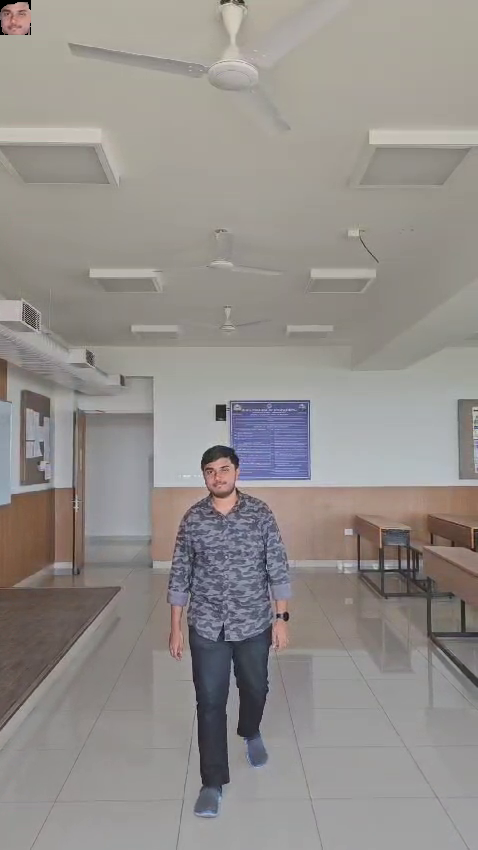

...

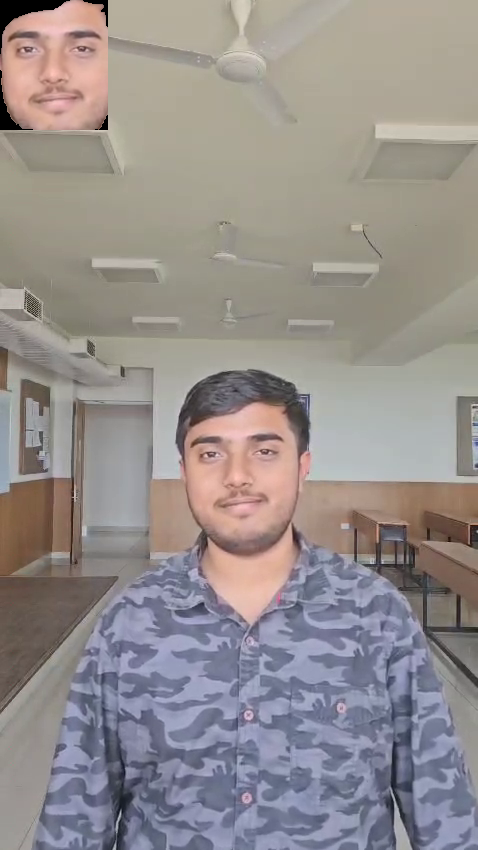

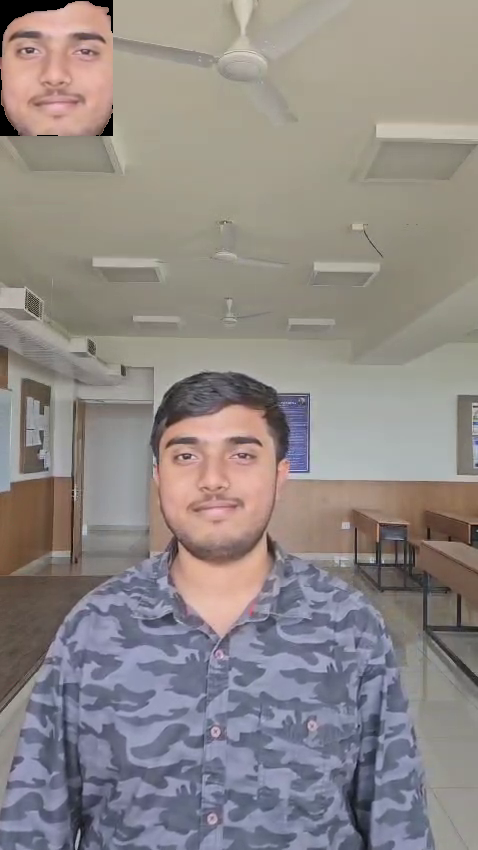

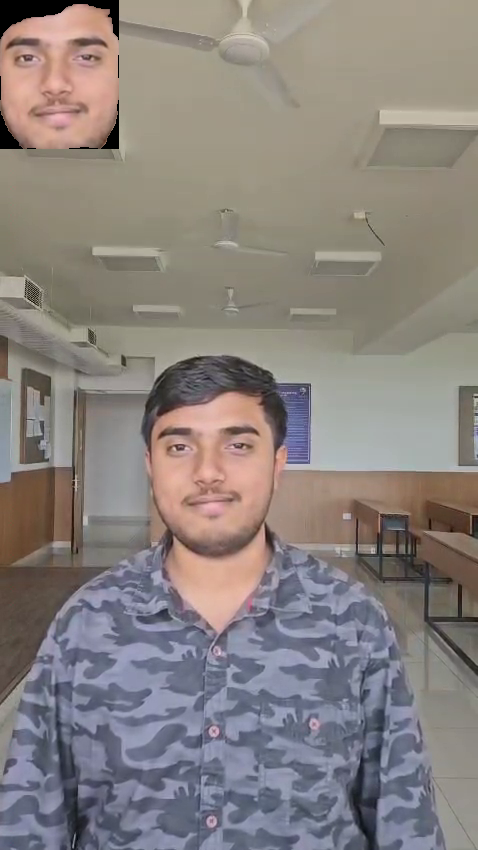

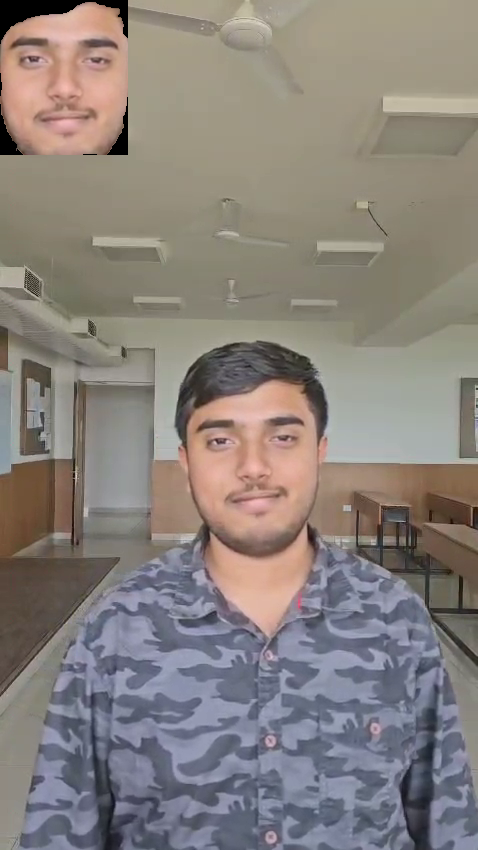

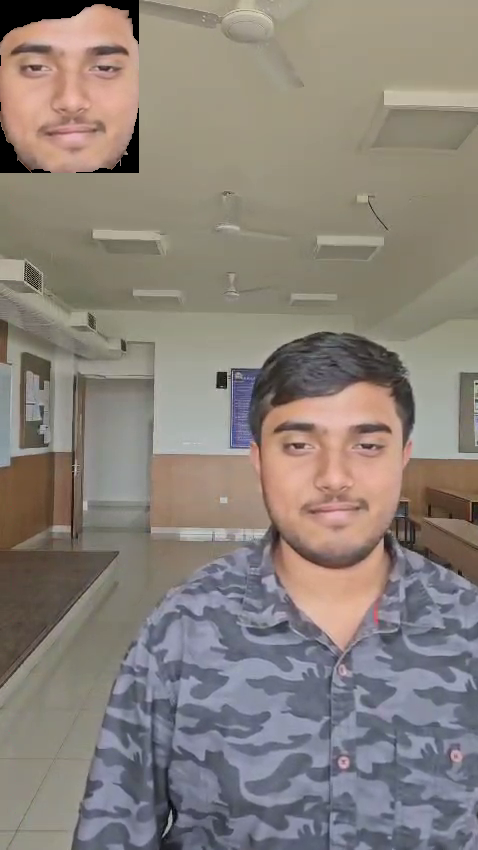

In [ ]:
import os
import cv2
import numpy as np
from mtcnn import MTCNN
from PIL import Image

# Initialize MTCNN face detector
detector = MTCNN()

# Define a function to remove background using GrabCut
def remove_background_with_grabcut(image, face_box):
    mask = np.zeros(image.shape[:2], np.uint8)
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Extract the bounding box from the detected face
    x, y, w, h = face_box
    rect = (x, y, w, h)

    # Apply GrabCut algorithm to remove the background
    cv2.grabCut(image, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    result = image * mask2[:, :, np.newaxis]  # Apply mask to the image

    return result

# Define a function to align the face based on the eyes' landmarks
def align_face(image, landmarks):
    left_eye = landmarks['left_eye']
    right_eye = landmarks['right_eye']

    # Calculate the angle between the eyes
    dx = right_eye[0] - left_eye[0]
    dy = right_eye[1] - left_eye[1]
    angle = np.degrees(np.arctan(dy / dx))

    # Get the center of the eyes
    eyes_center = ((float)(left_eye[0] + right_eye[0]) // 2, (float)(left_eye[1] + right_eye[1]) // 2)

    # Create the rotation matrix to align the face
    rot_mat = cv2.getRotationMatrix2D(eyes_center, angle, scale=1)

    # Perform the rotation
    rotated_image = cv2.warpAffine(image, rot_mat, (image.shape[1], image.shape[0]))

    return rotated_image

# Function to process video and save output
def process_video(input_video, output_video, output_folder):
    cap = cv2.VideoCapture(input_video)
    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = int(fps / 2)  # Process one frame every half second

    # Create output folder if not exists
    os.makedirs(output_folder, exist_ok=True)

    out = cv2.VideoWriter(output_video, cv2.VideoWriter_fourcc(*'XVID'), fps, (frame_width, frame_height))

    frame_count = 0
    face_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            faces = detector.detect_faces(frame)
            if len(faces) > 0:
                face_box = faces[0]['box']
                landmarks = faces[0]['keypoints']

                aligned_face = align_face(frame, landmarks)
                aligned_face_no_bg = remove_background_with_grabcut(aligned_face, face_box)

                x, y, w, h = face_box
                cropped_face = aligned_face_no_bg[y:y+h, x:x+w]
                frame[:h, :w] = cropped_face  # Place in top-left for visualization

                # Save extracted face image
                face_filename = os.path.join(output_folder, f"face_{face_count}.jpg")
                cv2.imwrite(face_filename, cropped_face)
                face_count += 1

            out.write(frame)
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        frame_count += 1

    cap.release()
    out.release()
    cv2.destroyAllWindows()

# Process the uploaded video
input_video_path = 'Adarsh.mp4'
output_video_path = 'processed_Adarsh.avi'
output_folder = 'extracted_faces'  # Folder to save face images
process_video(input_video_path, output_video_path, output_folder)

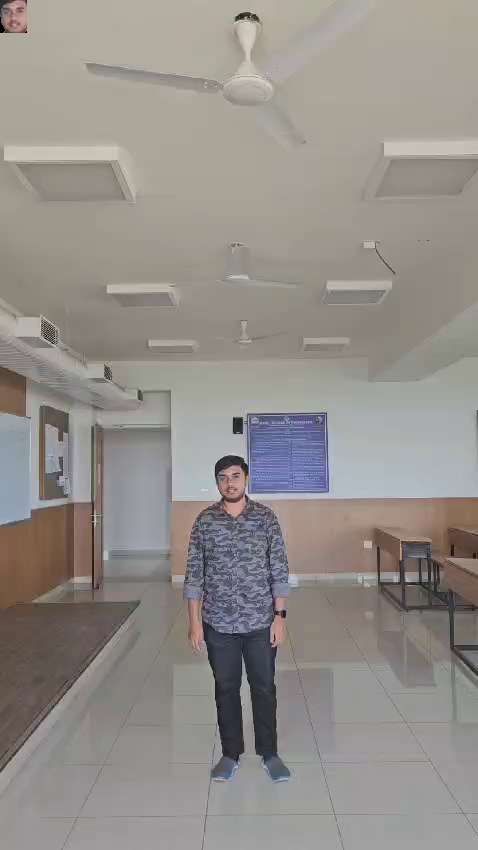

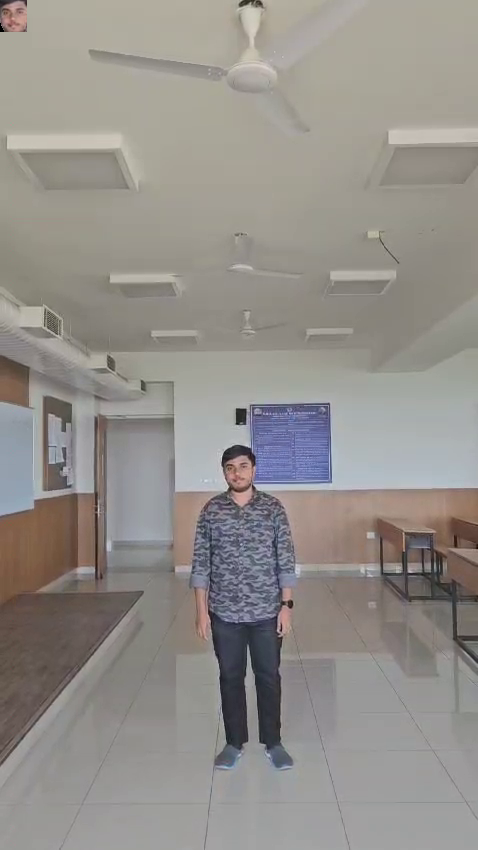

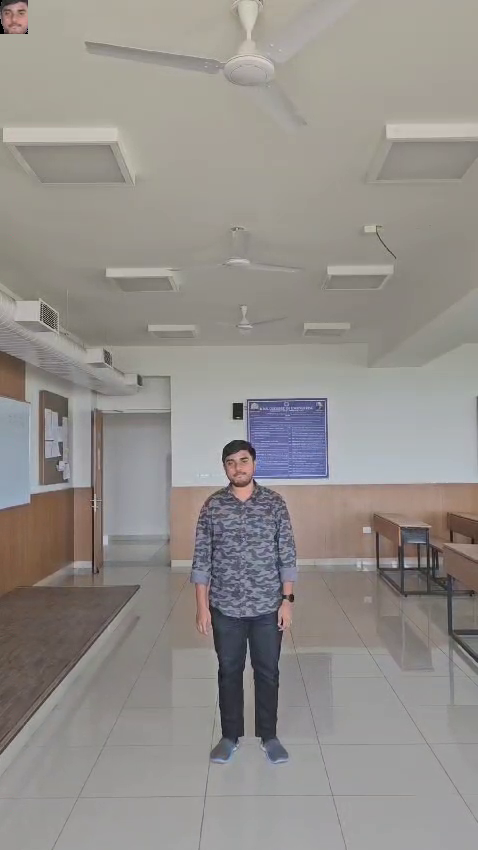

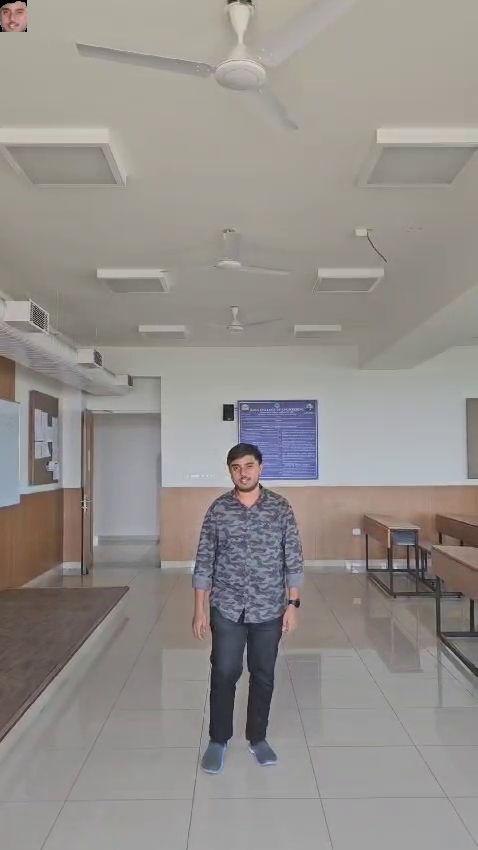

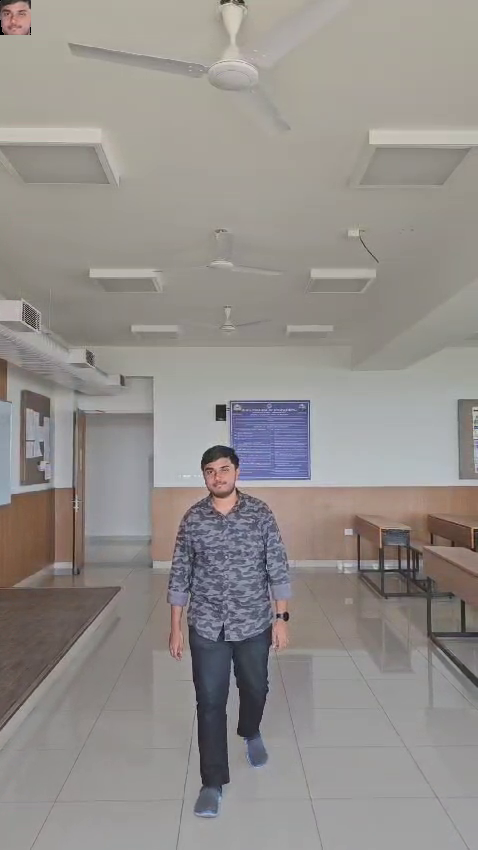

...

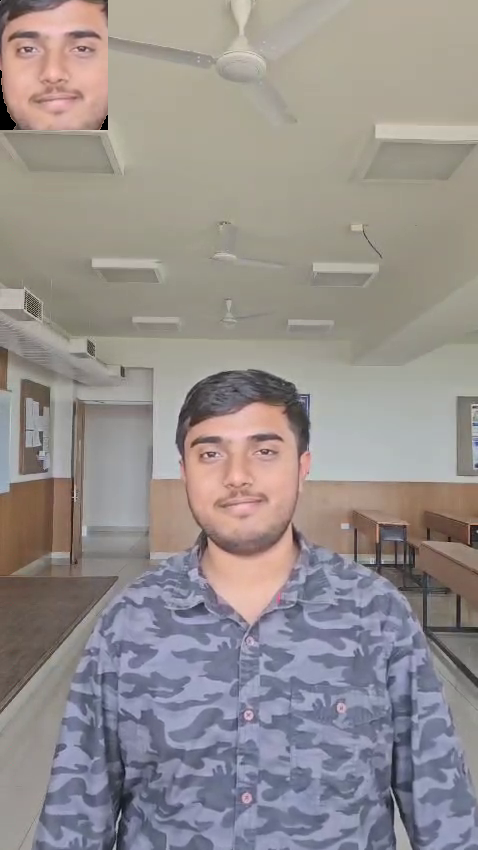

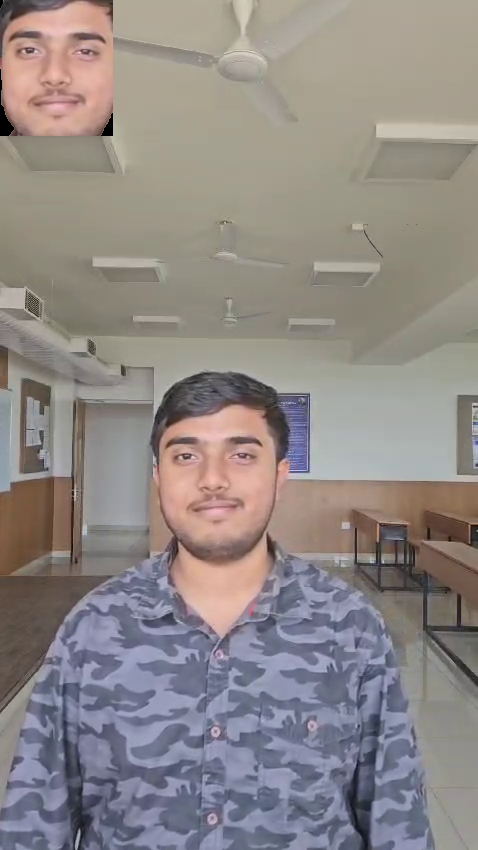

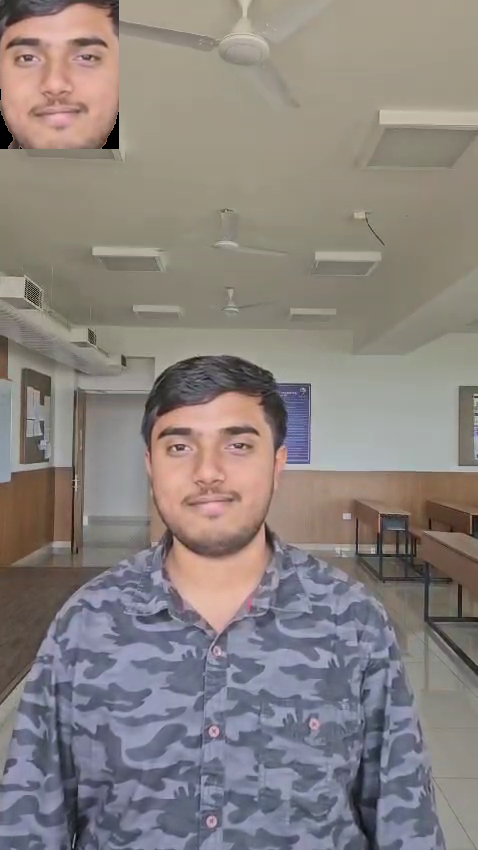

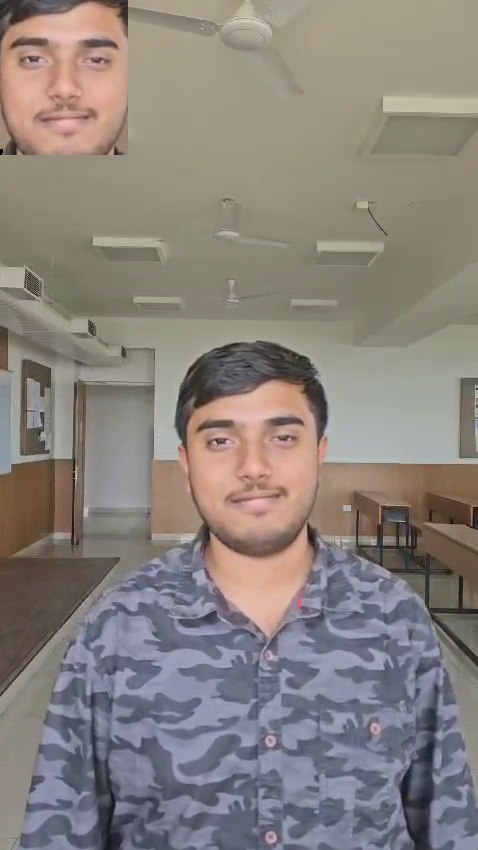

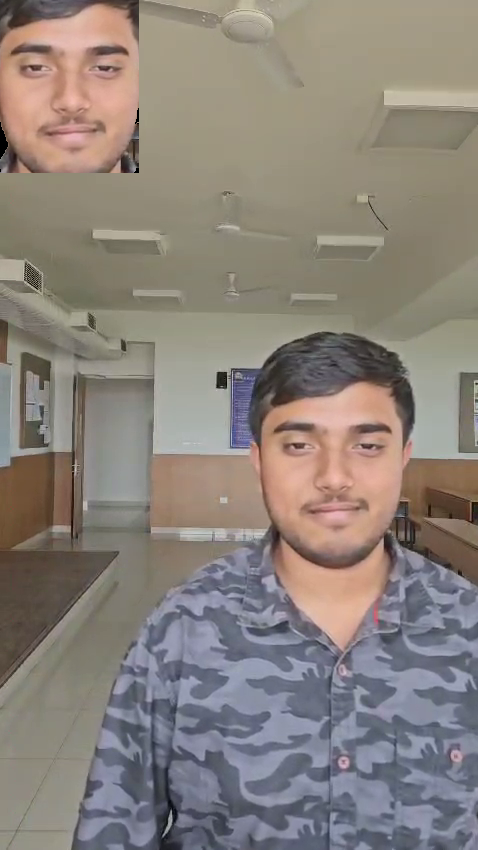

In [ ]:
import os
import cv2
import numpy as np
from mtcnn import MTCNN
from PIL import Image

# Initialize MTCNN face detector
detector = MTCNN()

# Define a function to remove background using GrabCut
def remove_background_with_grabcut(image, face_box):
    mask = np.zeros(image.shape[:2], np.uint8)
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Expand the bounding box to include hair and ears
    x, y, w, h = face_box
    x = max(0, x - int(0.2 * w))
    y = max(0, y - int(0.3 * h))
    w = min(image.shape[1] - x, int(1.4 * w))
    h = min(image.shape[0] - y, int(1.5 * h))
    rect = (x, y, w, h)

    # Apply GrabCut algorithm to remove the background
    cv2.grabCut(image, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    result = image * mask2[:, :, np.newaxis]  # Apply mask to the image

    return result

# Define a function to align the face based on the eyes' landmarks
def align_face(image, landmarks):
    left_eye = landmarks['left_eye']
    right_eye = landmarks['right_eye']

    # Calculate the angle between the eyes
    dx = right_eye[0] - left_eye[0]
    dy = right_eye[1] - left_eye[1]
    angle = np.degrees(np.arctan(dy / dx))

    # Get the center of the eyes
    eyes_center = ((float)(left_eye[0] + right_eye[0]) // 2, (float)(left_eye[1] + right_eye[1]) // 2)

    # Create the rotation matrix to align the face
    rot_mat = cv2.getRotationMatrix2D(eyes_center, angle, scale=1)

    # Perform the rotation
    rotated_image = cv2.warpAffine(image, rot_mat, (image.shape[1], image.shape[0]))

    return rotated_image

# Function to process video and save output
def process_video(input_video, output_video, output_folder):
    cap = cv2.VideoCapture(input_video)
    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = int(fps / 2)  # Process one frame every half second

    # Create output folder if not exists
    os.makedirs(output_folder, exist_ok=True)

    out = cv2.VideoWriter(output_video, cv2.VideoWriter_fourcc(*'XVID'), fps, (frame_width, frame_height))

    frame_count = 0
    face_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            faces = detector.detect_faces(frame)
            if len(faces) > 0:
                face_box = faces[0]['box']
                landmarks = faces[0]['keypoints']

                aligned_face = align_face(frame, landmarks)
                aligned_face_no_bg = remove_background_with_grabcut(aligned_face, face_box)

                x, y, w, h = face_box
                cropped_face = aligned_face_no_bg[y:y+h, x:x+w]
                frame[:h, :w] = cropped_face  # Place in top-left for visualization

                # Save extracted face image
                face_filename = os.path.join(output_folder, f"face_{face_count}.jpg")
                cv2.imwrite(face_filename, cropped_face)
                face_count += 1

            out.write(frame)
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        frame_count += 1

    cap.release()
    out.release()
    cv2.destroyAllWindows()

# Process the uploaded video
input_video_path = 'Adarsh.mp4'
output_video_path = 'processed_Adarsh.avi'
output_folder = 'extracted_faces'  # Folder to save face images
process_video(input_video_path, output_video_path, output_folder)


In [ ]:
import os
import cv2
import numpy as np
from mtcnn import MTCNN
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

# Initialize MTCNN face detector
detector = MTCNN()

# Function to extract features using OpenCV's deep learning model
def extract_features(image):
    model = cv2.dnn.readNetFromTorch("openface.nn4.small2.v1.t7")
    blob = cv2.dnn.blobFromImage(image, scalefactor=1.0/255, size=(96, 96), mean=(0, 0, 0), swapRB=True, crop=True)
    model.setInput(blob)
    return model.forward()

# Function to register a face from the first video
def register_face(input_video, output_folder):
    cap = cv2.VideoCapture(input_video)
    os.makedirs(output_folder, exist_ok=True)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        faces = detector.detect_faces(frame)
        if len(faces) > 0:
            x, y, w, h = faces[0]['box']
            registered_face = frame[y:y+h, x:x+w]
            face_filename = os.path.join(output_folder, "registered_face.jpg")
            cv2.imwrite(face_filename, registered_face)
            cap.release()
            return extract_features(cv2.resize(registered_face, (96, 96)))

    cap.release()
    return None

# Function to verify a face from the second video
def verify_face(input_video, registered_features):
    cap = cv2.VideoCapture(input_video)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        faces = detector.detect_faces(frame)
        if len(faces) > 0:
            x, y, w, h = faces[0]['box']
            test_face = frame[y:y+h, x:x+w]
            test_features = extract_features(cv2.resize(test_face, (96, 96)))

            similarity = cosine_similarity(registered_features, test_features)[0][0] * 100
            cap.release()
            if similarity > 80:
                print(f"PASS ({similarity:.2f}% match)")
            else:
                print(f"FAIL ({similarity:.2f}% match)")
            return

    cap.release()
    print("FAIL (No face detected)")

# Register face from first video
registered_features = register_face("Adarsh.mp4", "registered_face")
if registered_features is not None:
    # Verify face in second video
    verify_face("Adarsh.mp4", registered_features)
else:
    print("FAIL (No face detected in registration video)")


PASS (100.00% match)


In [6]:
import os
import cv2
import numpy as np
from mtcnn import MTCNN
from sklearn.metrics.pairwise import cosine_similarity

# Initialize MTCNN face detector
detector = MTCNN()

# Function to extract features using OpenCV's deep learning model
def extract_features(image):
    model = cv2.dnn.readNetFromTorch("openface.nn4.small2.v1.t7")
    blob = cv2.dnn.blobFromImage(image, scalefactor=1.0/255, size=(96, 96), mean=(0, 0, 0), swapRB=True, crop=True)
    model.setInput(blob)
    return model.forward()

# Function to process a video and extract face features at half-second intervals
def extract_faces_from_video(video_path):
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = int(fps / 2)  # Process every half second

    frame_count = 0
    extracted_features = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            faces = detector.detect_faces(frame)
            if len(faces) > 0:
                x, y, w, h = faces[0]['box']
                face = frame[y:y+h, x:x+w]
                face_resized = cv2.resize(face, (96, 96))

                # Extract features and store them
                features = extract_features(face_resized)
                extracted_features.append(features)

        frame_count += 1

    cap.release()
    return extracted_features

# Function to compare faces from two videos
def compare_videos(video1_path, video2_path):
    features_video1 = extract_faces_from_video(video1_path)
    features_video2 = extract_faces_from_video(video2_path)

    min_length = min(len(features_video1), len(features_video2))

    if min_length == 0:
        print("FAIL (No face detected in one or both videos)")
        return

    for i in range(min_length):
        similarity = cosine_similarity(features_video1[i], features_video2[i])[0][0] * 100
        if similarity > 80:
            print(f"PASS ({similarity:.2f}% match)")
        else:
            print(f"FAIL ({similarity:.2f}% match)")

# Run the face comparison on two videos
compare_videos("Adarsh.mp4", "Abhinav.mp4")


FAIL (56.44% match)
FAIL (56.34% match)
FAIL (54.92% match)
FAIL (59.81% match)
FAIL (74.71% match)
FAIL (61.77% match)
FAIL (52.99% match)
FAIL (64.17% match)
FAIL (77.99% match)
FAIL (67.89% match)
FAIL (75.16% match)
FAIL (77.39% match)
PASS (86.32% match)
PASS (86.97% match)
PASS (87.11% match)
PASS (84.20% match)
FAIL (79.12% match)
